In [1]:
from __future__ import print_function, division
import os
import torch
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

plt.ion()   # interactive mode

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import sys
sys.path.insert(0, '../')

In [4]:
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

# Training our first DL model using CNNs

In [5]:
from torch import nn
from torch.nn import init
import torch.nn.functional as F

In [6]:
256**2/64*128*136

17825792.0

In [7]:
class CNNNet(nn.Module):

    def __init__(self, input_shape, output_shape):
        super(CNNNet, self).__init__()
        
        self.output_shape = output_shape
        self.input_shape = input_shape

        C, W, H = input_shape
        P, D = output_shape

        self.features = nn.Sequential(
            nn.Conv2d(C, 32, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(32, 64, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(64, 128, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(128, 256, (3, 3), padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d((2, 2)),
        )

        self.classifier = nn.Sequential(
            nn.Linear(int(W/16*H/16*256), 256),
            nn.ReLU(inplace=True),
            nn.Linear(256, P*D)
        )

    def forward(self, x):    
        C, W, H = self.input_shape
        P, D = self.output_shape
        
        x = self.features(x)
        
        x = x.view(-1, int(W/16*H/16*256))
        
        x = self.classifier(x)
        
        return x.view(-1, P, D)


## Loading the dataset and splitting between train and valid

In [8]:
from cpe775.dataset import FaceLandmarksDataset
from torch.utils.data.sampler import SubsetRandomSampler
from torchvision.transforms import Compose
from cpe775.transforms import ToTensor, CropFace, ToGray

In [9]:
batch_size = 32
random_seed = 42
valid_size = 0.2
shuffle = True

In [10]:
transforms = Compose([
                   CropFace(enlarge_ratio=1.7),
                   ToGray(),
                   ToTensor()
                 ])

In [11]:
# load the dataset
dataset = FaceLandmarksDataset(csv_file='../data/train.csv',
                               root_dir='../data/',
                               transform=transforms)

num_train = len(dataset)
indices = list(range(num_train))
split = int(np.floor(valid_size * num_train))

if shuffle == True:
    np.random.seed(random_seed)
    np.random.shuffle(indices)

train_idx, valid_idx = indices[split:], indices[:split]

train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

train_loader = torch.utils.data.DataLoader(dataset, 
                batch_size=batch_size, sampler=train_sampler, num_workers=4)

valid_loader = torch.utils.data.DataLoader(dataset, 
                batch_size=batch_size, sampler=valid_sampler, num_workers=4)

## Creating the model

In [12]:
net = CNNNet((1, 256, 256), (68, 2)) # input shape, output shape

In [13]:
net = torch.nn.DataParallel(net)
net = net.cuda()

In [14]:
np.sum([v.numel() for v in net.parameters()])

17200264

## Creating the loss function

In [15]:
import torch
from cpe775.criterion import RMSELoss
from cpe775.model import Model
from cpe775 import callbacks

In [16]:
criterion = RMSELoss()
criterion = criterion.cuda()

In [17]:
optimizer = torch.optim.SGD(net.parameters(), 0.01, momentum=0.9)
model = Model(net, criterion=criterion)
model.set_optimizer(optimizer)

## Training

In [18]:
callback_list = [
        callbacks.Progbar(print_freq=40),
        callbacks.ModelCheckpoint('../results/cnnnet/checkpoint.pth.tar', 'val_loss', mode='min')
    ]

In [19]:
model.fit_loader(train_loader, 100, val_loader=valid_loader,
                 callback=callbacks.Compose(callback_list))

Epoch: [0][0/79]	Time 3.104 (3.104)	Data 1.857 (1.857)	Train Loss 2.084 (2.084)	
Epoch: [0][40/79]	Time 1.053 (0.406)	Data 1.027 (0.333)	Train Loss 0.166 (0.787)	
Val: [0/20]	Time 1.755 (1.755)	Data 1.731 (1.731)	Val Loss 0.191 (0.191)	
Epoch: [1][0/79]	Time 1.356 (1.356)	Data 1.330 (1.330)	Train Loss 0.230 (0.230)	
Epoch: [1][40/79]	Time 0.839 (0.389)	Data 0.814 (0.354)	Train Loss 0.190 (0.195)	
Val: [0/20]	Time 1.766 (1.766)	Data 1.743 (1.743)	Val Loss 0.176 (0.176)	
Epoch: [2][0/79]	Time 1.850 (1.850)	Data 1.822 (1.822)	Train Loss 0.215 (0.215)	
Epoch: [2][40/79]	Time 0.070 (0.368)	Data 0.000 (0.326)	Train Loss 0.180 (0.187)	
Val: [0/20]	Time 1.344 (1.344)	Data 1.320 (1.320)	Val Loss 0.223 (0.223)	
Epoch: [3][0/79]	Time 1.741 (1.741)	Data 1.715 (1.715)	Train Loss 0.200 (0.200)	
Epoch: [3][40/79]	Time 0.310 (0.372)	Data 0.284 (0.325)	Train Loss 0.175 (0.192)	
Val: [0/20]	Time 2.046 (2.046)	Data 2.023 (2.023)	Val Loss 0.152 (0.152)	
Epoch: [4][0/79]	Time 2.175 (2.175)	Data 2.144 (2.14

Val: [0/20]	Time 1.356 (1.356)	Data 1.332 (1.332)	Val Loss 0.094 (0.094)	
Epoch: [35][0/79]	Time 1.810 (1.810)	Data 1.782 (1.782)	Train Loss 0.070 (0.070)	
Epoch: [35][40/79]	Time 0.089 (0.345)	Data 0.063 (0.306)	Train Loss 0.063 (0.065)	
Val: [0/20]	Time 1.503 (1.503)	Data 1.480 (1.480)	Val Loss 0.077 (0.077)	
Epoch: [36][0/79]	Time 2.055 (2.055)	Data 2.027 (2.027)	Train Loss 0.071 (0.071)	
Epoch: [36][40/79]	Time 0.069 (0.415)	Data 0.000 (0.371)	Train Loss 0.053 (0.064)	
Val: [0/20]	Time 1.577 (1.577)	Data 1.551 (1.551)	Val Loss 0.069 (0.069)	
Epoch: [37][0/79]	Time 1.734 (1.734)	Data 1.706 (1.706)	Train Loss 0.057 (0.057)	
Epoch: [37][40/79]	Time 0.310 (0.357)	Data 0.285 (0.316)	Train Loss 0.054 (0.061)	
Val: [0/20]	Time 1.479 (1.479)	Data 1.456 (1.456)	Val Loss 0.072 (0.072)	
Epoch: [38][0/79]	Time 1.371 (1.371)	Data 1.345 (1.345)	Train Loss 0.053 (0.053)	
Epoch: [38][40/79]	Time 0.514 (0.348)	Data 0.489 (0.307)	Train Loss 0.061 (0.059)	
Val: [0/20]	Time 1.551 (1.551)	Data 1.528 (1

Epoch: [69][0/79]	Time 1.693 (1.693)	Data 1.667 (1.667)	Train Loss 0.034 (0.034)	
Epoch: [69][40/79]	Time 0.432 (0.380)	Data 0.406 (0.339)	Train Loss 0.041 (0.036)	
Val: [0/20]	Time 2.119 (2.119)	Data 2.096 (2.096)	Val Loss 0.068 (0.068)	
Epoch: [70][0/79]	Time 1.878 (1.878)	Data 1.851 (1.851)	Train Loss 0.046 (0.046)	
Epoch: [70][40/79]	Time 0.071 (0.385)	Data 0.022 (0.338)	Train Loss 0.031 (0.035)	
Val: [0/20]	Time 2.399 (2.399)	Data 2.376 (2.376)	Val Loss 0.061 (0.061)	
Epoch: [71][0/79]	Time 1.959 (1.959)	Data 1.930 (1.930)	Train Loss 0.039 (0.039)	
Epoch: [71][40/79]	Time 0.581 (0.417)	Data 0.555 (0.375)	Train Loss 0.033 (0.036)	
Val: [0/20]	Time 1.777 (1.777)	Data 1.754 (1.754)	Val Loss 0.063 (0.063)	
Epoch: [72][0/79]	Time 1.409 (1.409)	Data 1.381 (1.381)	Train Loss 0.039 (0.039)	
Epoch: [72][40/79]	Time 0.071 (0.379)	Data 0.000 (0.340)	Train Loss 0.034 (0.034)	
Val: [0/20]	Time 1.625 (1.625)	Data 1.602 (1.602)	Val Loss 0.068 (0.068)	
Epoch: [73][0/79]	Time 1.329 (1.329)	Data 1.

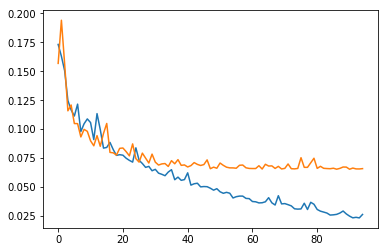

In [20]:
plt.plot(callback_list[1].history['train_loss'][5:])
plt.plot(callback_list[1].history['val_loss'][5:])

In [21]:
checkpoint = torch.load('../results/cnnnet/checkpoint.pth-best.tar')

## Loading the best model

In [22]:
from cpe775.utils.img_utils import show_landmarks_batch

In [27]:
best_model = Model(CNNNet((1, 256, 256), (68, 2)))
best_net = model.net
best_net.load_state_dict(checkpoint['state_dict'])

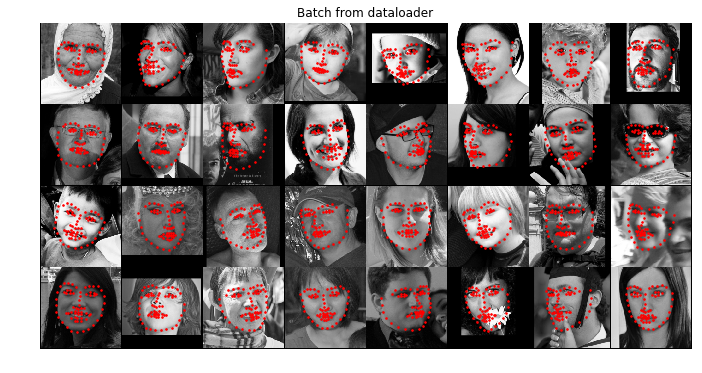

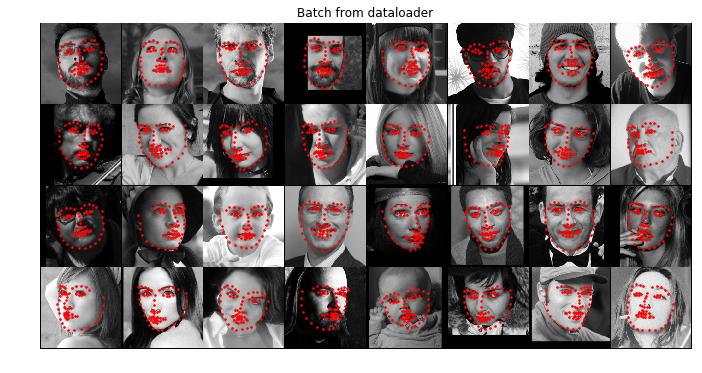

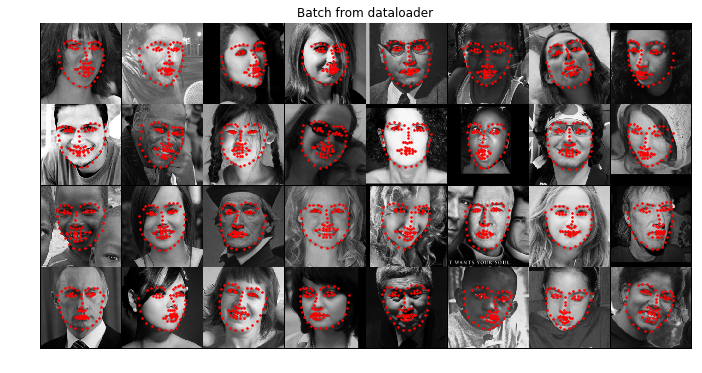

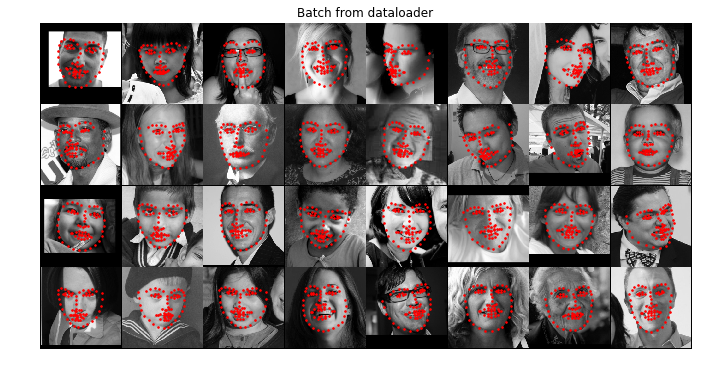

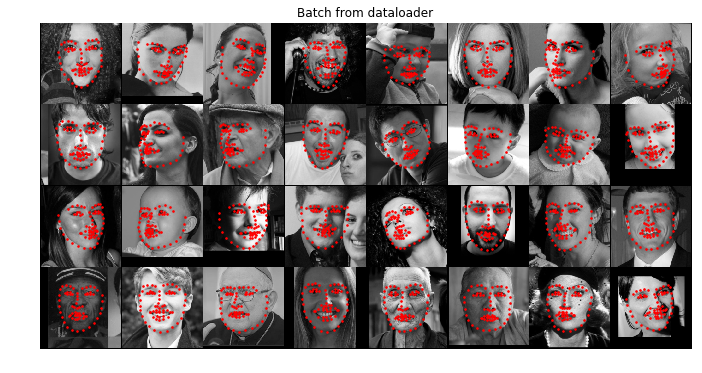

...

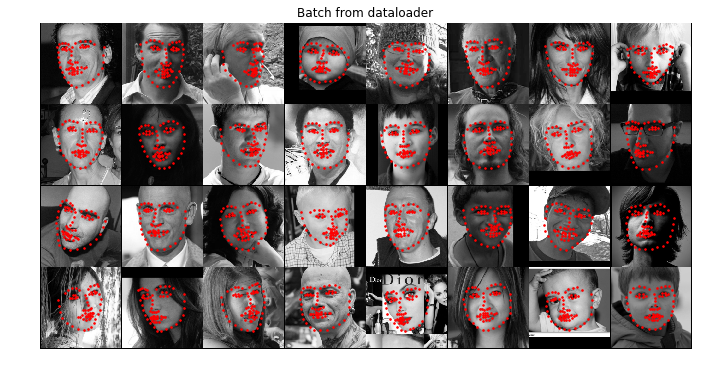

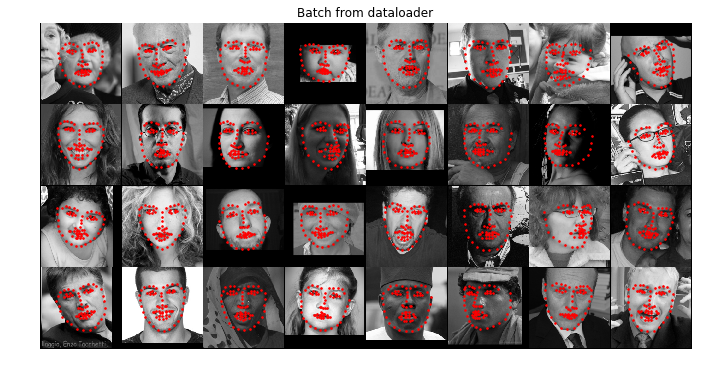

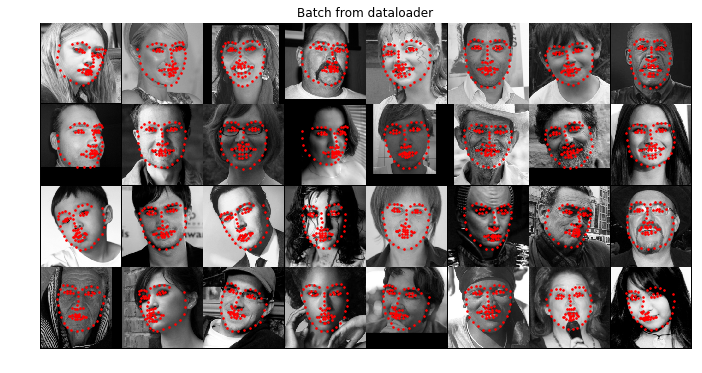

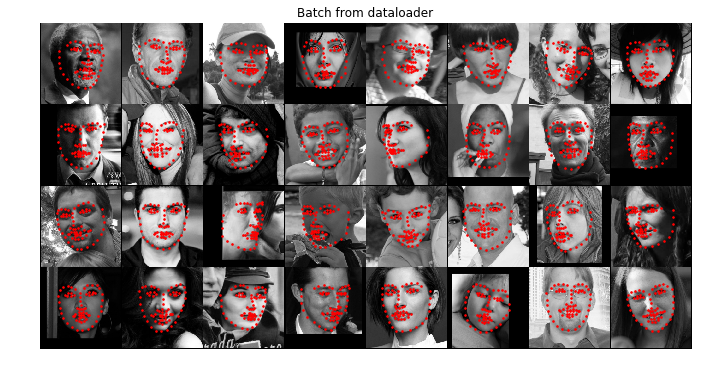

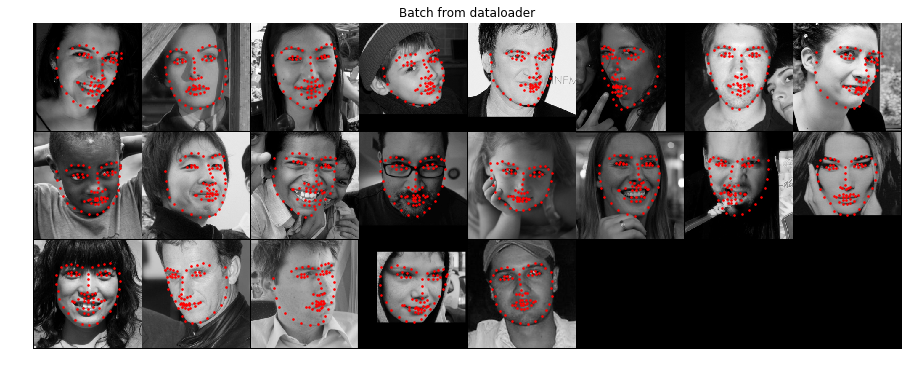

In [28]:
for i_batch, sample_batched in enumerate(valid_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

### Common test

In [29]:
# load the dataset
dataset = FaceLandmarksDataset(csv_file='../data/common_test.csv',
                               root_dir='../data/',
                               transform=transforms)

common_loader = torch.utils.data.DataLoader(dataset, 
                batch_size=batch_size, num_workers=4)

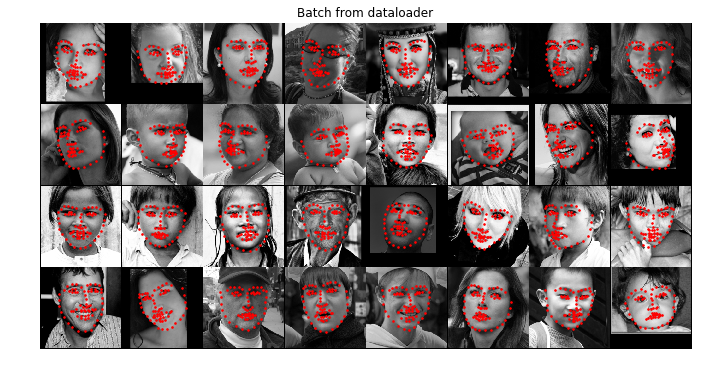

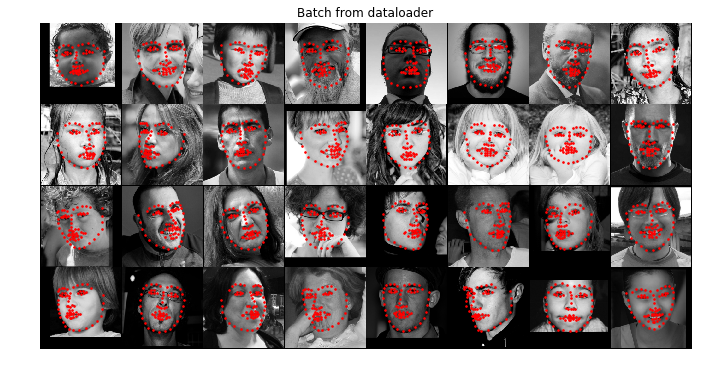

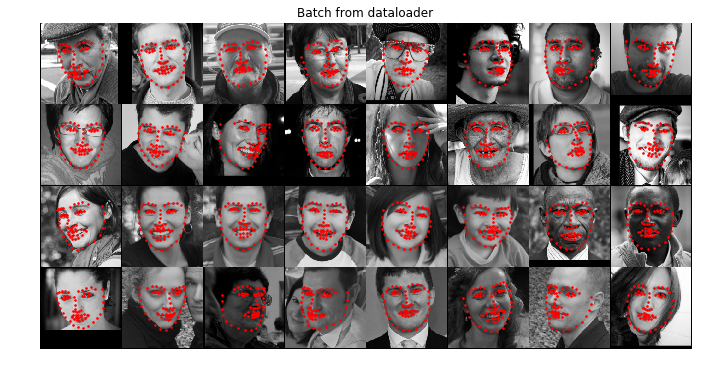

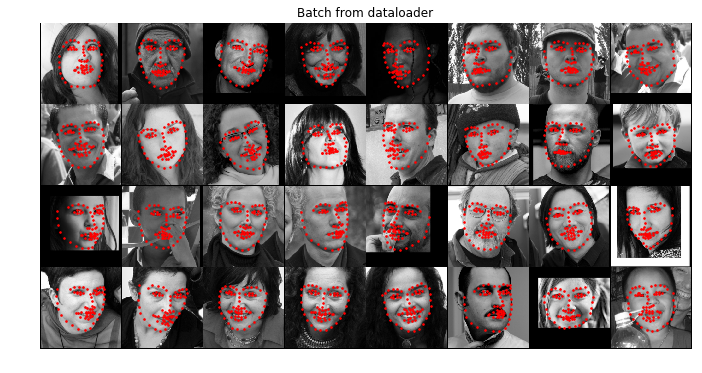

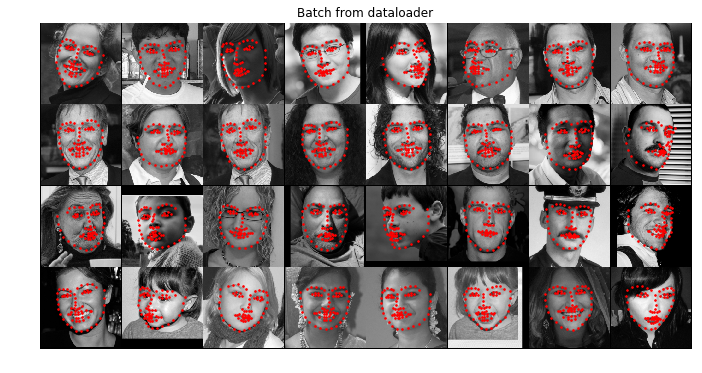

...

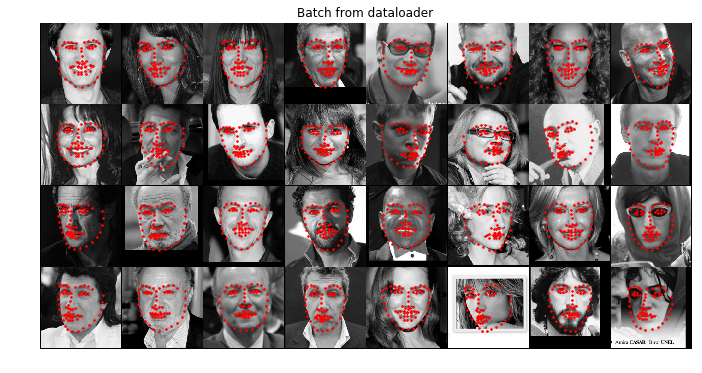

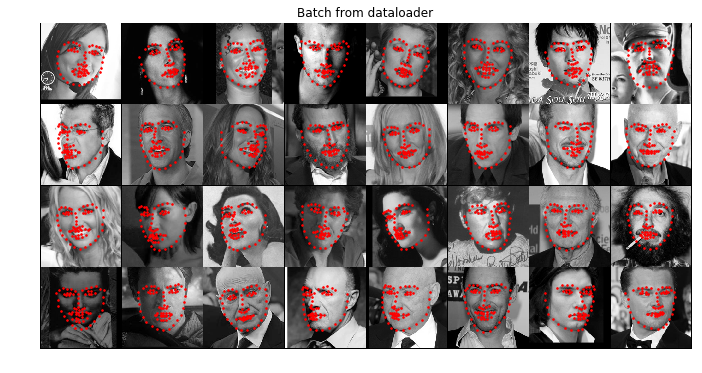

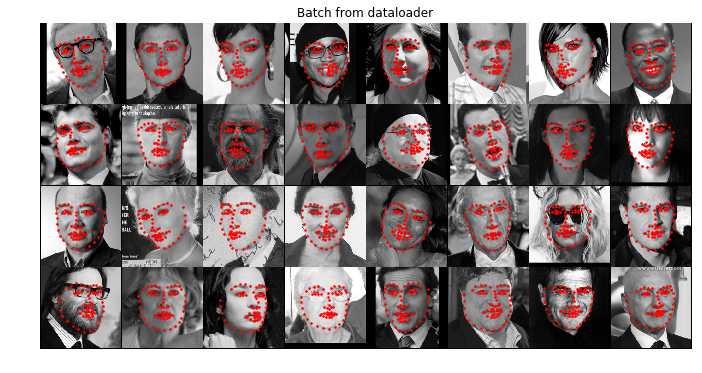

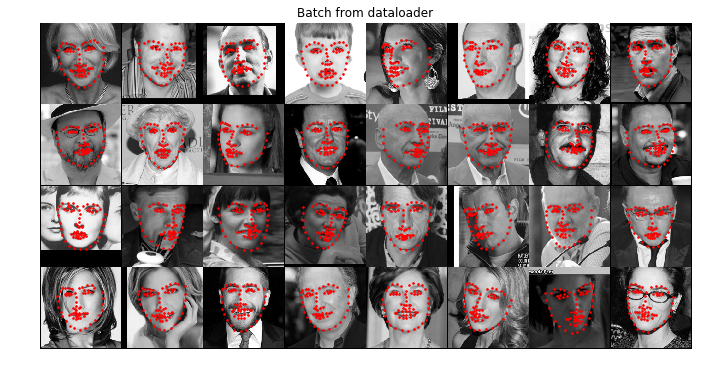

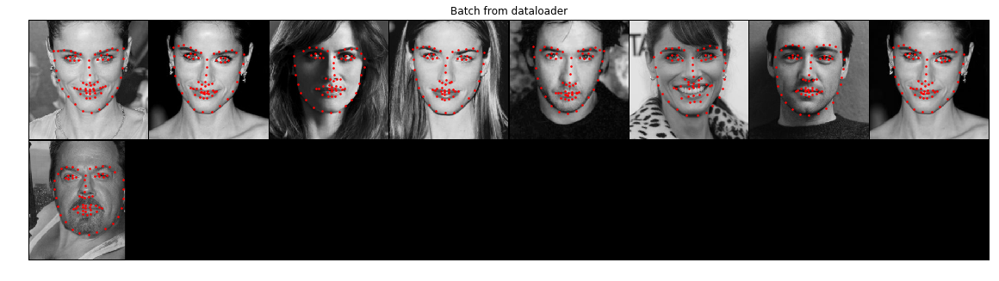

In [30]:
loss = 0
for i_batch, sample_batched in enumerate(common_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    
    loss += predicted_landmarks.shape[0]*criterion(predicted_landmarks, sample_batched['landmarks'])
    
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

In [31]:
loss/len(dataset)

0.0615624980849448

### Challenging test

In [32]:
# load the dataset
challenging_set = FaceLandmarksDataset(csv_file='../data/challenging_test.csv',
                               root_dir='../data/',
                               transform=transforms)

challeging_loader = torch.utils.data.DataLoader(challenging_set, 
                batch_size=batch_size, num_workers=4)

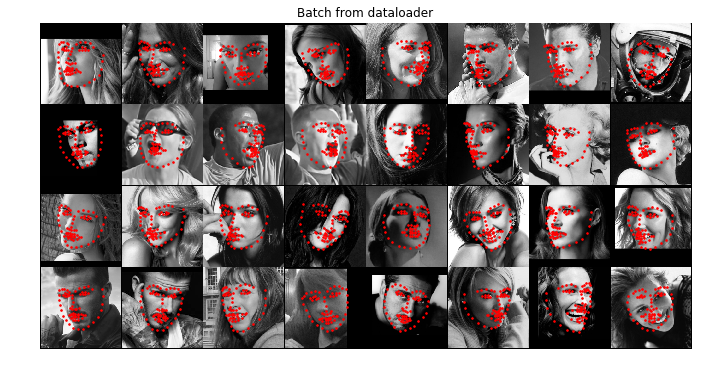

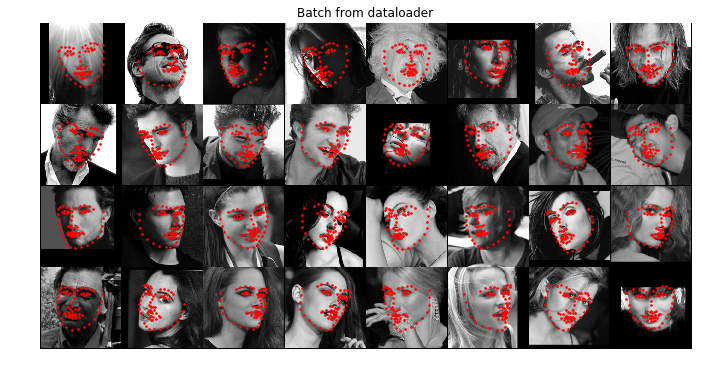

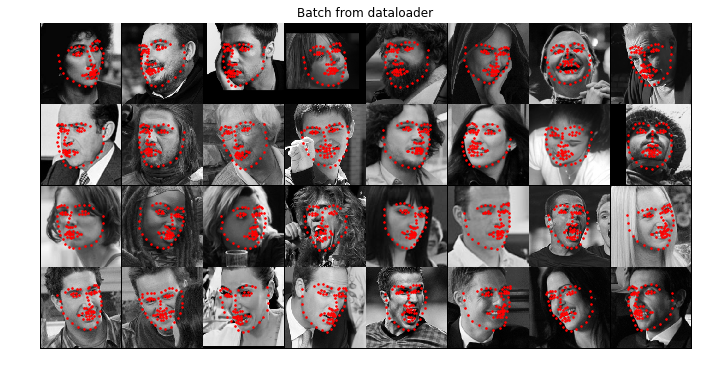

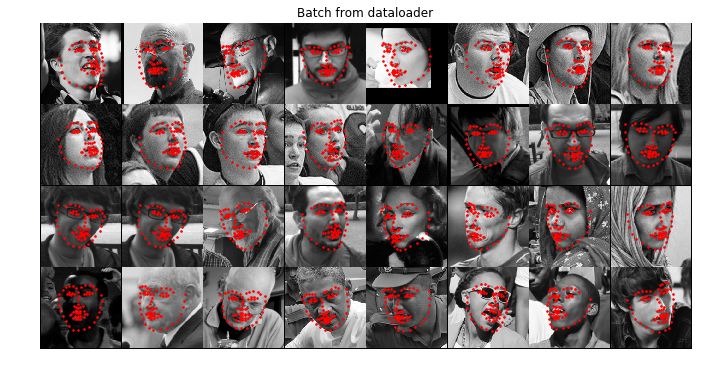

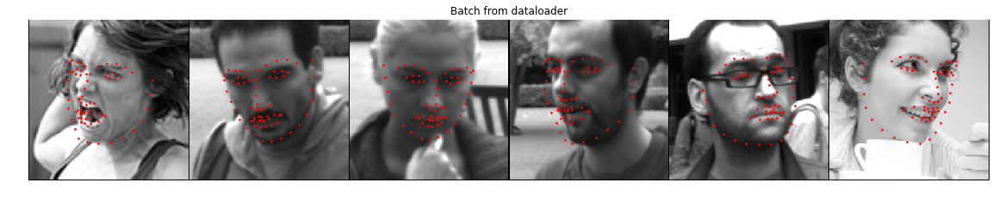

In [33]:
loss = 0
for i_batch, sample_batched in enumerate(challeging_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    
    loss += predicted_landmarks.shape[0]*criterion(predicted_landmarks, sample_batched['landmarks'])
    
    plt.figure(figsize=(20,6))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks})
    plt.axis('off')
    plt.ioff()
    plt.show()

In [34]:
loss/len(challenging_set)

0.13615964464287258